In [1]:
# reloading modules if needed
from importlib import reload

# first import the whole package
import PyPolyCrystals

# then (re)load all the functions in the .py files in the .../PyPolyCrystals/ directory:
from PyPolyCrystals import *
reload(PyPolyCrystals)
from PyPolyCrystals import *

[KeOps] Compiling cuda jit compiler engine ... OK
[pyKeOps] Compiling nvrtc binder for python ... OK


In [2]:
import copy

torch.set_printoptions(precision=10) # show more digits

device = "cuda" if torch.cuda.is_available() else "cpu"
dt = torch.float64
torch.set_default_dtype(dt)
#torch.set_default_device(device)

In [3]:
# SMALL EXAMPLE

# file = "../../data/2D_basic_example/EBSD_example_2D_data.txt"

# seed_id = (1,2)
# volumes_id = (3)
# orientation_id = (4,5,6)
# X, A, TV, EBSD = load_setup_from_EBSD_data_2D(file = file,
#                                              seed_id = seed_id,
#                                              volumes_id = volumes_id,
#                                              orientation_id = orientation_id,
#                                              normalise_matrices = True,
#                                              device = device,
#                                              dt = dt)
# X = X.to(device,dtype=dt)
# A = A.to(device,dtype=dt)
# TV = TV.to(device,dtype=dt)
# N, D = X.shape
# #M = 1500

In [4]:
# # LARGE EXAMPLE

# file = "../../data/2D_Tata_steel_example/DC06 TD_dwars grain_file.txt"
# seed_id = (4,5)
# volumes_id = (11)
# orientation_id = (14,15,16)

# X, A, TV, EBSD = load_setup_from_EBSD_data_2D(file = file,
#                                              seed_id = seed_id,
#                                              volumes_id = volumes_id,
#                                              orientation_id = orientation_id,
#                                              normalise_matrices = True,
#                                              device = device,
#                                              dt = dt)
# X = X.to(device,dtype=dt)
# A = A.to(device,dtype=dt)
# TV = TV.to(device,dtype=dt)
# N, D = X.shape
# #M=4000

In [5]:
# # NEW EXAMPLE

# file = "../../data/2D_Tata_Steel_new_example/Sample_LC steel_grain_file.txt"
# seed_id = (5,6)
# volumes_id = (11)
# orientation_id = (14,15,16)

# X, A, TV, EBSD = load_setup_from_EBSD_data_2D(file = file,
#                                              seed_id = seed_id,
#                                              volumes_id = volumes_id,
#                                              orientation_id = orientation_id,
#                                              normalise_matrices = True,
#                                              device = device,
#                                              dt = dt)
# X = X.to(device,dtype=dt)
# A = A.to(device,dtype=dt)
# TV = TV.to(device,dtype=dt)
# N, D = X.shape
# #M=4000

In [3]:
# NEW EXAMPLE with input from MTEX

file = "../../data/2D_Tata_Steel_paper_example/sample_lc_steel_grain_file_final.txt"
seed_id = (0,1)
volumes_id = (5)
orientation_id = (2,3,4)

X, A, TV, EBSD = load_setup_from_EBSD_data_2D(file = file,
                                             seed_id = seed_id,
                                             volumes_id = volumes_id,
                                             orientation_id = orientation_id,
                                             normalise_matrices = True,
                                             angle_in_degrees = False,
                                             device = device,
                                             dt = dt)
X = X.to(device,dtype=dt)
A = A.to(device,dtype=dt)
TV = TV.to(device,dtype=dt)
N, D = X.shape
#M=4000

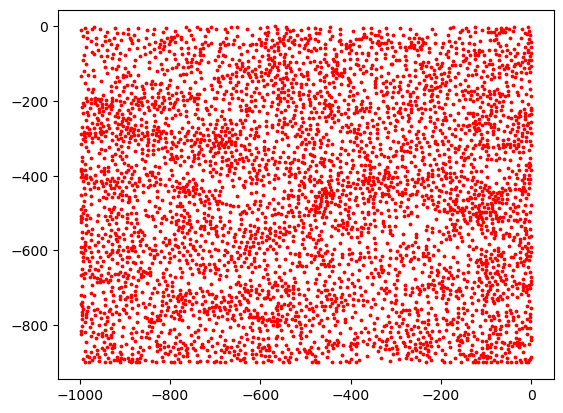

In [4]:
# check the rough size of the box by plotting the seeds:
plt.scatter(X[:,0].cpu().numpy(),X[:,1].cpu().numpy(),c='r',s=3)

In [5]:
dom_x = [-999.0268,0.4998]
dom_y = [-901.0001,0.5003]
domain = torch.tensor([dom_x,dom_y])
domain

tensor([[-9.9902680000e+02,  4.9980000000e-01],
        [-9.0100010000e+02,  5.0030000000e-01]])

In [9]:
#domain = torch.tensor([[-998.5271,0.0],[-900.4998,-0.0]])

In [6]:
domain[0][0]

tensor(-999.0268000000)

In [7]:
# it appears to be roughly a square, so we will infer the size of the square box as follows:
total_area = TV.sum()
print("Largest grain: ", torch.max(TV).cpu().numpy(), "Smallest grain: ",torch.min(TV).cpu().numpy())
#print("Largest grain: ", torch.max(TV).cpu().numpy(), ". Smallest grain: ",torch.min(TV).cpu().numpy()),# ". Ratio: ",(torch.max(TV)/torch.min(TV)).cpu().numpy())

Largest grain:  2073.79661128761 Smallest grain:  11.000898081641


In [12]:
# we've got tiniest of grains, got to get rid of them first hehe

In [8]:
total_area

tensor(901841.6678694368, device='cuda:0')

In [14]:
# size_x = X[:,0].max() - X[:,0].min()
# size_y = X[:,1].max() - X[:,1].min()

In [15]:
#total_area / size_x

In [16]:
#size_y

In [10]:
apd1 = apd_system(D=2,
                  domain = domain,
                  X = X,
                  As = A,
                  heuristic_W = True, # the default set of weights is the heuristic guess!
                  target_masses = TV/total_area,
                  dt = torch.float64,
                  device = device,
                  pixel_size_prefactor = 1.0,
                  error_tolerance = 0.01
                  )

In [11]:
# we have this many grains:
apd1.N

4587

In [12]:
apd1.pixel_params

(2863, 2863)

In [13]:
#ratio = apd1.domain[0][1]/apd1.domain[1][1]
#ratio

len_x = dom_x[1] - dom_x[0]
len_y = dom_y[1] - dom_y[0]

ratio = len_x / len_y
ratio

1.108736723799568

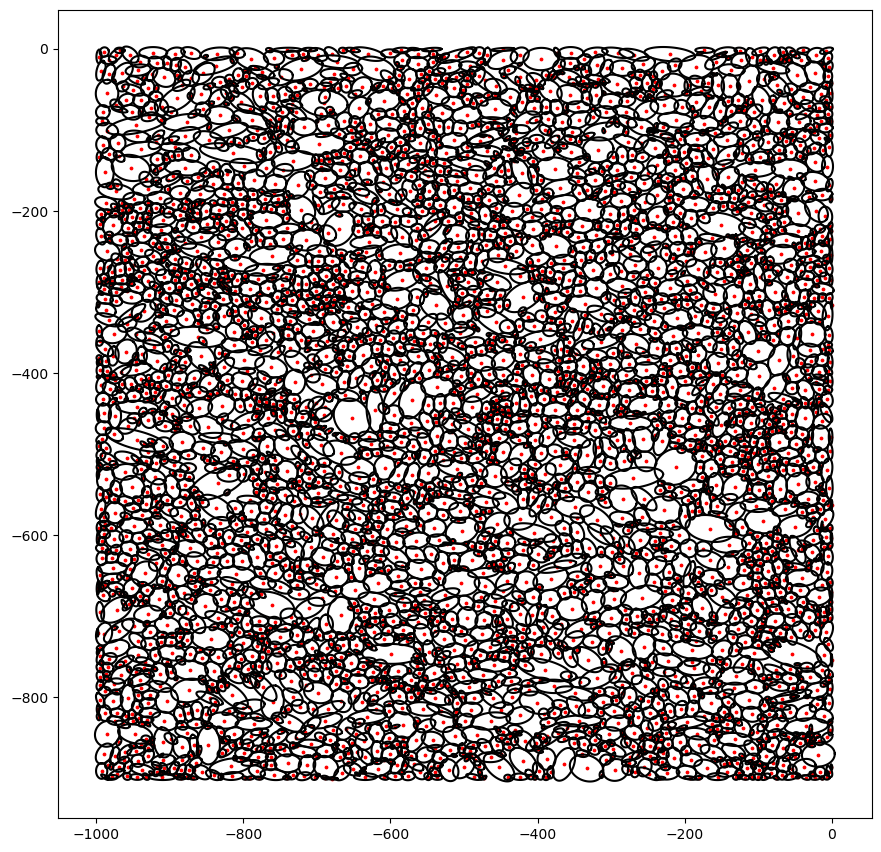

In [15]:
ff, ax1 = apd1.plot_ellipses()

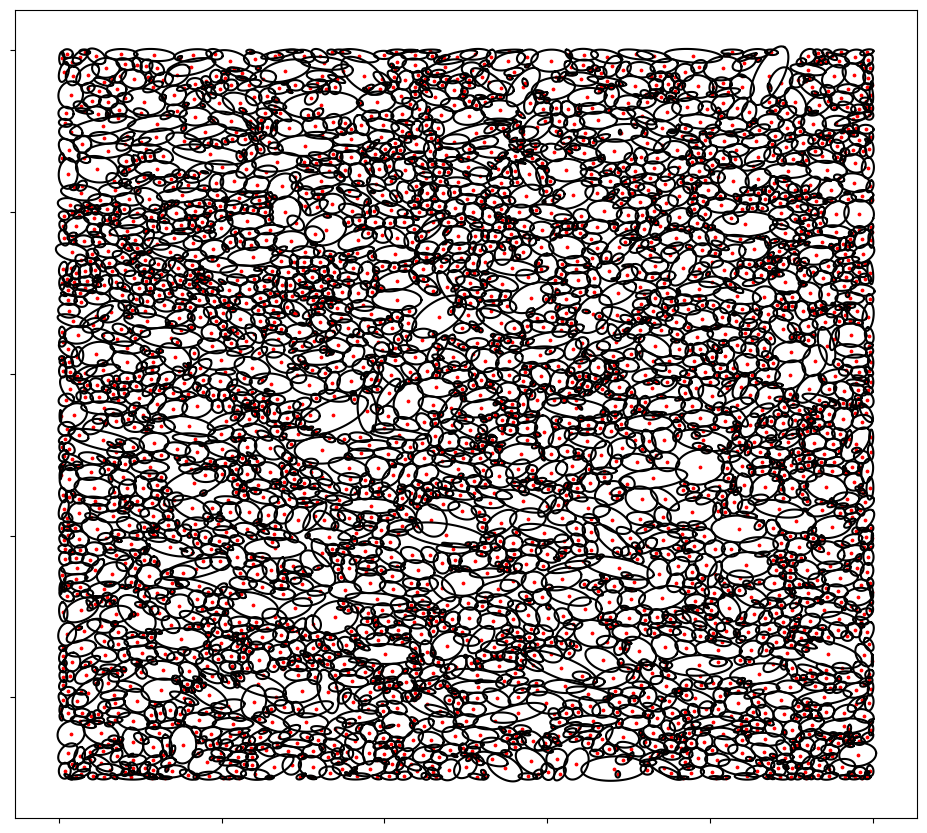

In [16]:
ff.set_size_inches(ratio*10.5, 10.5, forward=True)
ax1.set_xticklabels([])
ax1.set_yticklabels([])
#ax1.set_xlim(0.0,902.0)
#ax1.set_ylim(0.0,1002.0)
ff

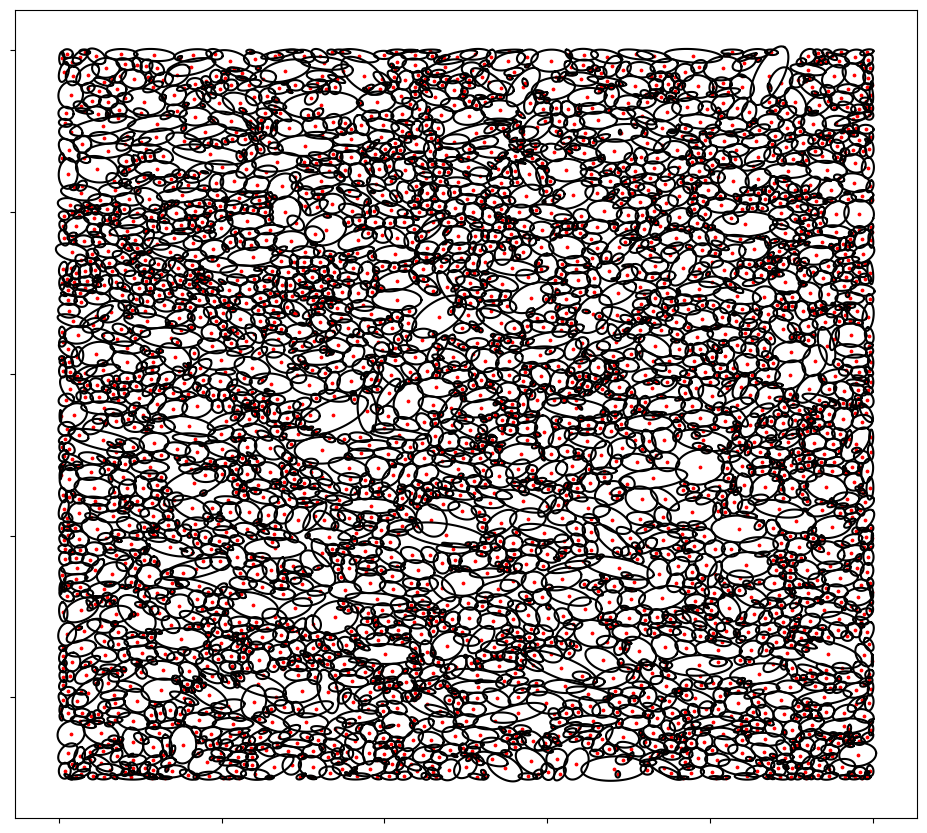

In [17]:
ff

In [18]:
ff.savefig('new_example_ellipses_mtex2.pdf')

In [19]:
# copy the heuristic guess
W_guess = copy.copy(apd1.W)

In [20]:
apd1.assemble_pixels()

In [21]:
EBSD[:,-3:].shape

torch.Size([3890, 3])

In [22]:
EBSD[:,-1].shape

torch.Size([3890])

In [23]:
# with heuristic guess, we get this APD:

img = apd1.assemble_apd(color_by = EBSD[:,-3:])

#apd1.plot_apd(color_by = EBSD[:,-3:])
;

''

In [24]:
apd1.pixel_params + (3,)

(2657, 2657, 3)

In [25]:
img2 = img.reshape(apd1.pixel_params + (3,)).transpose(0,1).cpu()

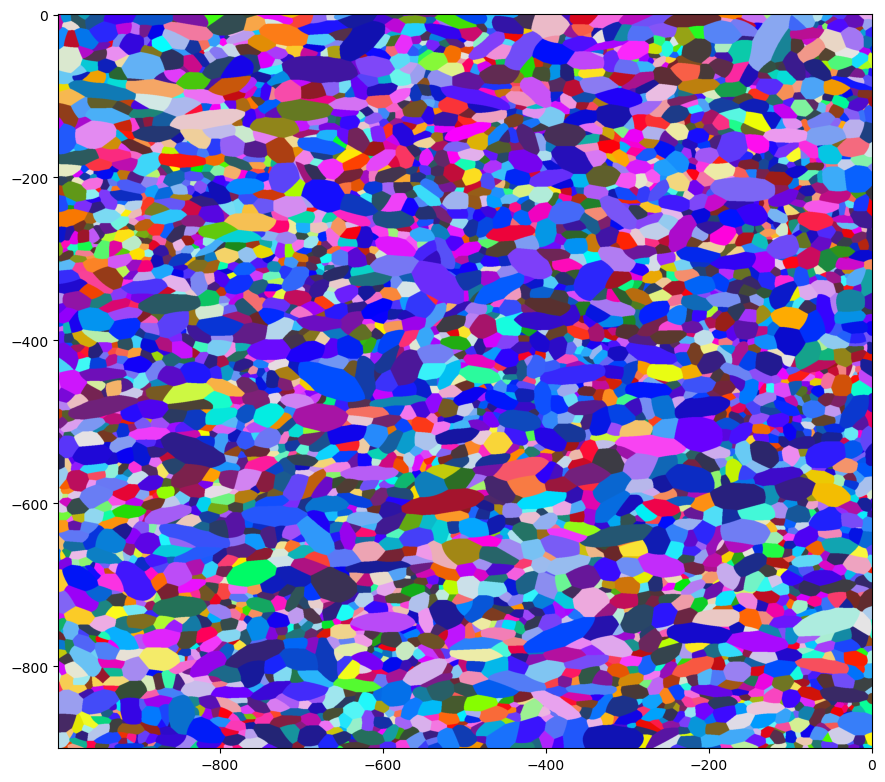

In [26]:
fig, (ax1) = plt.subplots(1,1)
fig.set_size_inches(10.5, 10.5, forward=True)
ax1.imshow(img2, origin='lower', extent = torch.flatten( apd1.domain ).tolist())
#ax1.invert_yaxis()
#ax1.invert_xaxis()

In [27]:
# but the error is still huge:
Dg, error = apd1.check_optimality(return_gradient_and_error=True)

Precision loss detected!
Percentage error =  530.6195161032108


In [28]:
# we can play around with Dg or its weighted version:
wDg = torch.abs(Dg)/apd1.target_masses

# e.g. the percentage of grains that have relative error less than 10%:
((wDg < 0.1).sum())/len(wDg)

tensor(0.6120822622, device='cuda:0')

In [29]:
# let's save the assignment vector (or "the grain map"):
img1 = apd1.assemble_apd()

In [30]:
# and now solve the OT problem to get optimal weights:
apd1.find_optimal_W(max_iter = 5000)

Solver tolerance is with respect to each grain separately.
Smallest tol:  tensor(0.1274513661, device='cuda:0')
Optimality condition successfully overwritten.
Optimization terminated successfully.
         Current function value: -81014643.998346
         Iterations: 489
         Function evaluations: 905
It took 82.87008118629456 seconds to find optimal W.


In [31]:
apd1.check_optimality()

The APD is optimal!
Percentage error =  0.845988034086248


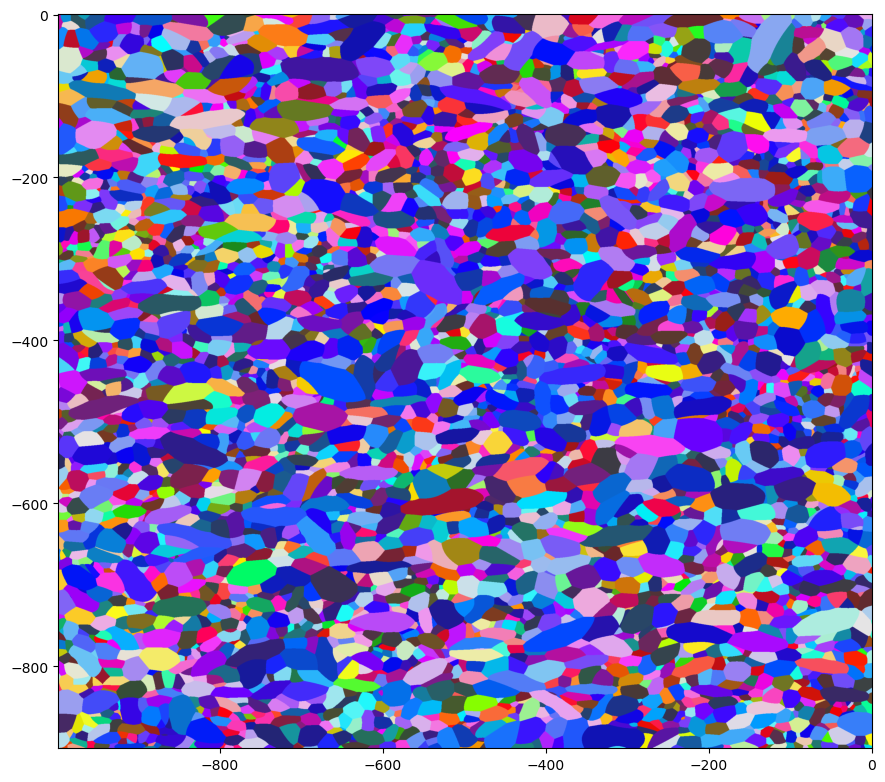

In [32]:
#fig, ax1 = apd1.plot_apd(color_by = EBSD[:,orientation_id[-1]])
img = apd1.assemble_apd(color_by = EBSD[:,-3:])
img2 = img.reshape(apd1.pixel_params + (3,)).transpose(0,1).cpu()
fig, (ax1) = plt.subplots(1,1)
fig.set_size_inches(10.5, 10.5, forward=True)
ax1.imshow(img2, origin='lower', extent = torch.flatten( apd1.domain ).tolist())
#ax1.invert_yaxis()
#ax1.invert_xaxis()

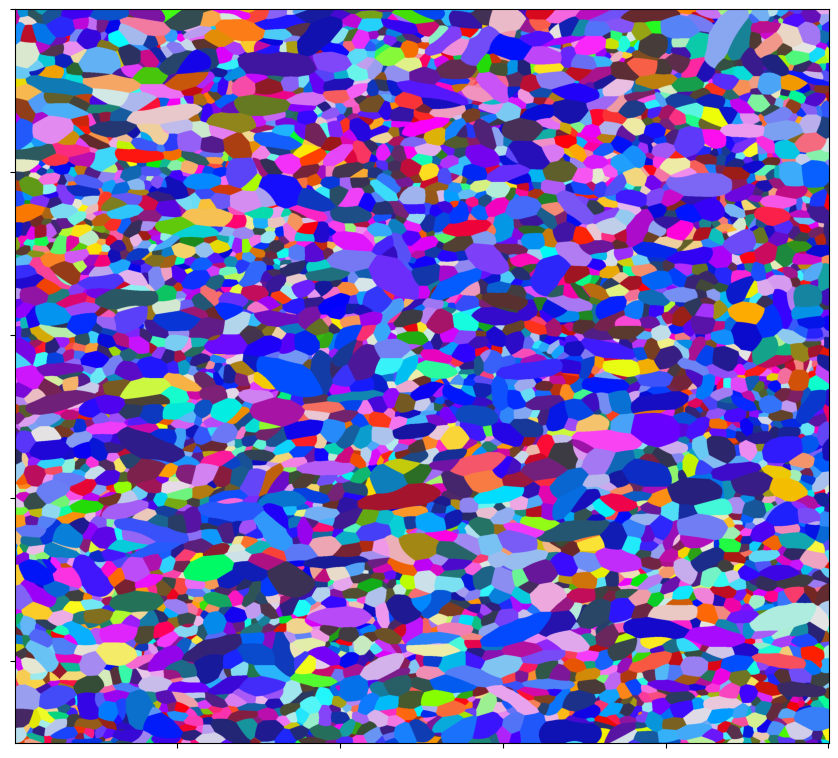

In [33]:
ax1.set_xticklabels([])
ax1.set_yticklabels([])

fig.savefig('new_example2.pdf')
fig

In [34]:
# let's save the optimal apd grain map:
img2 = apd1.assemble_apd()

In [35]:
img_diff = (img1-img2).reshape(apd1.pixel_params)

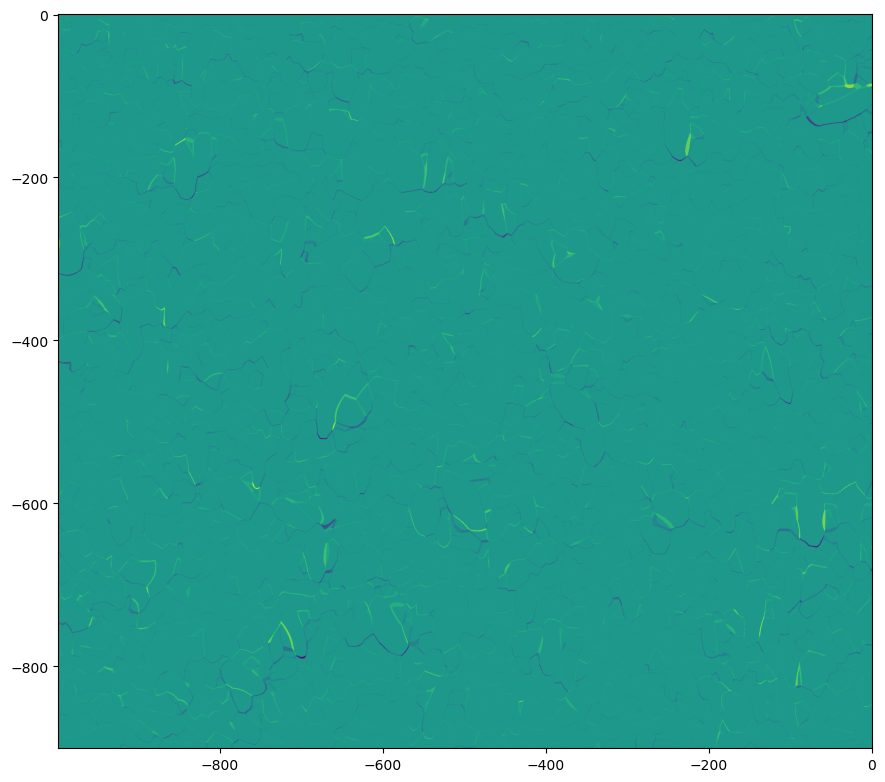

In [36]:
# and let's plot the difference:
img_diff = img_diff.cpu()
fig, (ax1) = plt.subplots(1,1)
fig.set_size_inches(10.5, 10.5, forward=True)
ax1.imshow(img_diff, origin='lower', extent = torch.flatten( apd1.domain ).tolist())

In [37]:
# let's compare how many pixels are assigned differently between the heuristic W and the optimal W
import math
all_pixels = math.prod(apd1.pixel_params)
misassigned_pixels = (img_diff != 0).sum()
misassigned_pixels/all_pixels

tensor(0.0567633037)

In [42]:
# only about 5.6% 
# in the literature it is reported that the heuristic guess gives about 92% accuracy
# (i.e. 92% are assigned in the same way as in pixelated EBSD data)
# so even in the worst case scenario our optimal APD is 84.3% accurate :)
# by the way even the linear programming approaches report pixel accuracy of something like 93.34% -  95.59%

In [38]:
# finally let's check whether heuristic guess was a good initial guess for the solver:
apd1.set_W(W=torch.zeros(apd1.N).to(device=apd1.device,dtype=apd1.dt))
apd1.optimality = False
apd1.check_optimality()
apd1.find_optimal_W()

Precision loss detected!
Percentage error =  2498.9786372696462
Solver tolerance is with respect to each grain separately.
Smallest tol:  tensor(0.1274513661, device='cuda:0')
Optimality condition successfully overwritten.
Optimization terminated successfully.
         Current function value: -81014625.320303
         Iterations: 296
         Function evaluations: 494
It took 45.68181085586548 seconds to find optimal W.


In [39]:
apd1.check_optimality()

The APD is optimal!
Percentage error =  0.9669578714613148


# Fitting distributions and generating artificial microstructure

In [110]:
colors = [(230/255,97/255,1/255),
(253/255,184/255,99/255),
(178/255,171/255,210/255),
(94/255,60/255,153/255)]

In [111]:
import scipy
import scipy.stats

In [112]:
TV_log = torch.log(TV).cpu().numpy()
ratios = (EBSD[:,orientation_id[0]]/EBSD[:,orientation_id[1]])
ratios_log = torch.log(ratios).cpu().numpy()
#angles = (EBSD[:,orientation_id[-1]]*torch.pi / 180).cpu().numpy()
angles = (EBSD[:,orientation_id[-1]]).cpu().numpy()

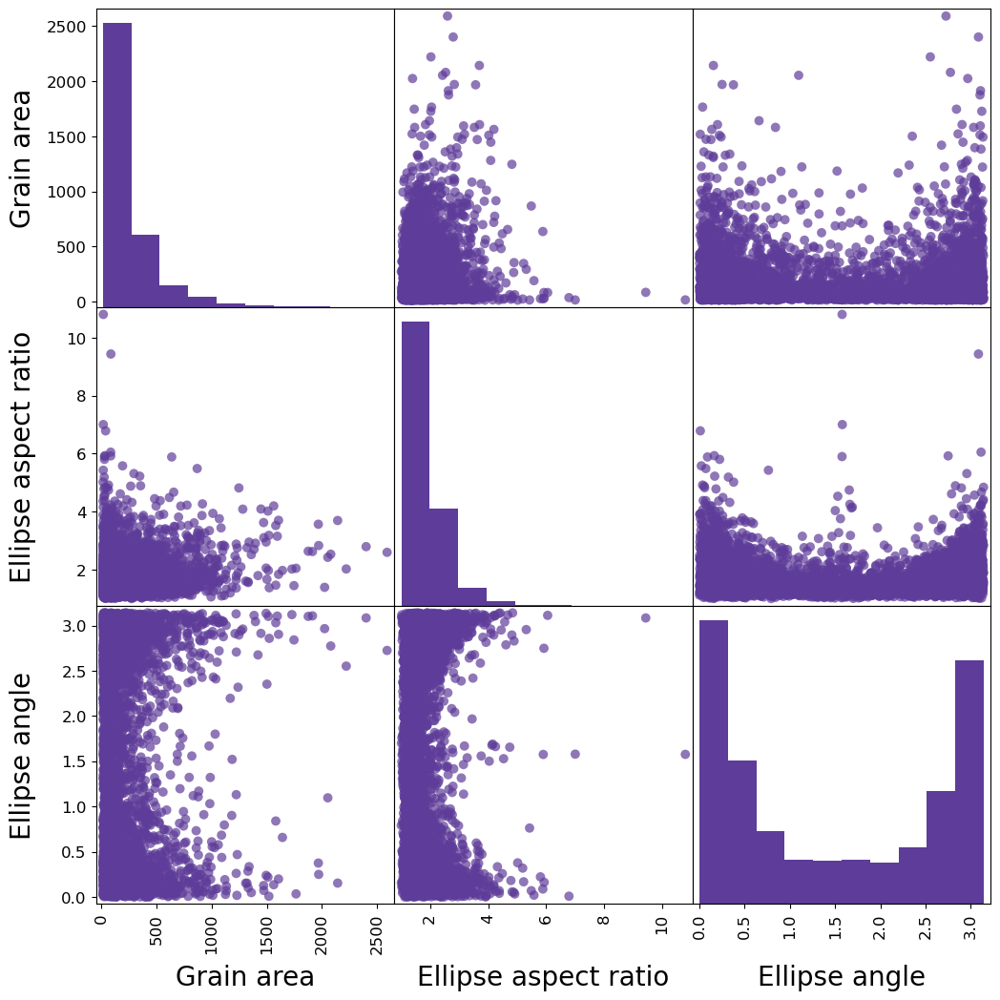

In [113]:
data = [[TV.cpu().numpy()[i], ratios.cpu().numpy()[i], angles[i]] for i in range(len(TV_log))]

import pandas as pd

#fig = plt.figure()

df = pd.DataFrame(data, columns=['Grain area','Ellipse aspect ratio','Ellipse angle'])
axes = pd.plotting.scatter_matrix(df, alpha=0.7,diagonal='hist', hist_kwds={'color':colors[3]},
                                  figsize=(10.5,10.5),s=200, color=colors[3])
for ax in axes.flatten():
    ax.xaxis.label.set_rotation(0)
    ax.xaxis.label.set_size(20)
    ax.yaxis.label.set_size(20)
    ax.yaxis.label.set_rotation(90)
    ax.yaxis.label.set_ha('center')
    ax.get_yaxis().set_label_coords(-0.2,0.5)
#    ax.get_major_ticks().label.set_fontsize(14) 
    for tick in ax.xaxis.get_major_ticks():
        tick.label1.set_fontsize(12) 
    for tick in ax.yaxis.get_major_ticks():
        tick.label1.set_fontsize(12) 

    
    ax.xaxis.label.set_ha('center')
    ax.get_xaxis().set_label_coords(0.5,-0.2)

plt.tight_layout()
plt.gcf().subplots_adjust(wspace=0, hspace=0)
#plt.savefig('ebsd_scatter_matrix_plot_new_example_mtex2.pdf')  

In [23]:
# # sampling
# data = [[TV_log[i], ratios_log[i], angles[i]] for i in range(len(TV_log))]
# mean = np.mean(data, axis=0)
# cov = np.cov(data, rowvar=0)

# import numpy.random as nr
# nr.seed(seed=12)
# joint_sample = nr.multivariate_normal(mean, cov, size=N)

# #[[np.exp(sample[0]), np.exp(sample[1]), sample[2]] for sample in joint_sample]

# TV = np.array([np.exp(sample[0]) for sample in joint_sample])
# TV = torch.from_numpy(TV).to(device,dtype=dt)

# ratios = np.array([np.exp(sample[1]) for sample in joint_sample])
# ratios = torch.from_numpy(ratios).to(device,dtype=dt)

# angles = np.array([sample[2] for sample in joint_sample])
# thetas = torch.from_numpy(angles).to(device,dtype=dt)

In [21]:
# transformed_sample = np.array([[np.exp(sample[0]), np.exp(sample[1]),sample[2]] for sample in joint_sample])

# import pandas as pd

# #fig = plt.figure()

# df = pd.DataFrame(transformed_sample, columns=['Target volumes','Aspect ratio','Orientation'])
# axes = pd.plotting.scatter_matrix(df, alpha=0.7,diagonal='hist', hist_kwds={'color':colors[3]},
#                                   figsize=(10.5,10.5),s=200,color=colors[3])
# for ax in axes.flatten():
#     ax.xaxis.label.set_rotation(0)
#     ax.xaxis.label.set_size(16)
#     ax.yaxis.label.set_size(16)
#     ax.yaxis.label.set_rotation(90)
#     ax.yaxis.label.set_ha('center')
#     ax.get_yaxis().set_label_coords(-0.2,0.5)
# #    ax.get_major_ticks().label.set_fontsize(14) 
#     for tick in ax.xaxis.get_major_ticks():
#         tick.label1.set_fontsize(12) 
#     for tick in ax.yaxis.get_major_ticks():
#         tick.label1.set_fontsize(12) 

    
#     ax.xaxis.label.set_ha('center')
#     ax.get_xaxis().set_label_coords(0.5,-0.2)

# plt.tight_layout()
# plt.gcf().subplots_adjust(wspace=0, hspace=0)

In [126]:
import openturns as ot
# kernel smoothing approach to sampling
data = [[TV[i], ratios[i], angles[i]] for i in range(len(TV))]
#ks = ot.KernelSmoothing(boundaryCorrection = True)
kernel = ot.Uniform()
ks = ot.KernelSmoothing(kernel)
#ks = ot.KernelSmoothing()
#binned = True # by default True
#binNumber = 64
#ks = ot.KernelSmoothing(kernel, binned)
#boundaryCorrection = True # by default False
#ks = ot.KernelSmoothing(kernel, binned, binNumber, boundaryCorrection)
fittedDist = ks.build(data)

In [130]:
ot.RandomGenerator.SetSeed(50)

In [82]:
" " 

' '

In [131]:
sample = fittedDist.getSample(apd1.N)
np_sample = np.array(sample)

In [132]:
np_sample[:,0].min()

-75.5536801975527

In [133]:
np_sample[:,0] = np_sample[:,0] - np_sample[:,0].min() + 1.0

In [134]:
np_sample[:,0].min()

1.0

In [135]:
shift = 1.0 - np_sample[:,1].min()
np_sample[:,1] = np_sample[:,1] + shift

In [136]:
np_sample[:,1].min()

1.0

In [137]:
TV = torch.tensor(np_sample[:,0])
TV = TV / TV.sum()
ratios = torch.tensor(np_sample[:,1])
thetas = torch.tensor(np_sample[:,2])

In [138]:
np.pi

3.141592653589793

In [139]:
thetas[thetas > np.pi] -= np.pi

In [140]:
thetas[thetas < 0.0] += np.pi

In [141]:
np_sample[:,2] = np.array(thetas)

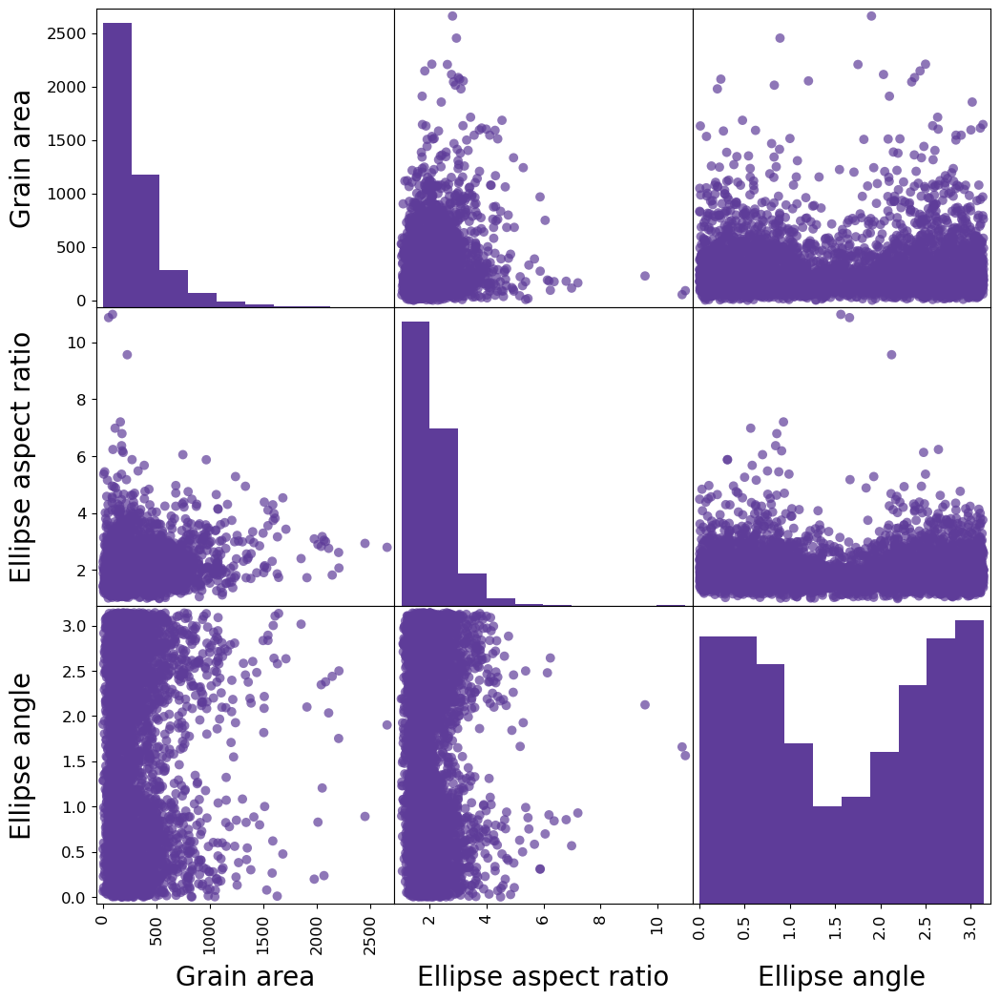

In [143]:
import pandas as pd

#fig = plt.figure()

df = pd.DataFrame(np_sample, columns=['Grain area','Ellipse aspect ratio','Ellipse angle'])
axes = pd.plotting.scatter_matrix(df, alpha=0.7,diagonal='hist', hist_kwds={'color':colors[3]},
                                  figsize=(10.5,10.5),s=200,color=colors[3])
for ax in axes.flatten():
    ax.xaxis.label.set_rotation(0)
    ax.xaxis.label.set_size(20)
    ax.yaxis.label.set_size(20)
    ax.yaxis.label.set_rotation(90)
    ax.yaxis.label.set_ha('center')
    ax.get_yaxis().set_label_coords(-0.2,0.5)
#    ax.get_major_ticks().label.set_fontsize(14) 
    for tick in ax.xaxis.get_major_ticks():
        tick.label1.set_fontsize(12) 
    for tick in ax.yaxis.get_major_ticks():
        tick.label1.set_fontsize(12) 

    
    ax.xaxis.label.set_ha('center')
    ax.get_xaxis().set_label_coords(0.5,-0.2)

plt.tight_layout()
plt.gcf().subplots_adjust(wspace=0, hspace=0)
plt.savefig('ebsd_scatter_matrix_plot_artificial_mtex2.pdf')  

In [144]:
a_s = torch.sqrt(ratios)
b_s = 1.0/a_s
b_s

tensor([0.6600519517, 0.7164124401, 0.8890107730,  ..., 0.5801784059,
        0.6567999489, 0.6856186022])

In [145]:
ss = torch.sin(thetas)
cc = torch.cos(thetas)
rots = torch.stack([torch.stack([cc, -ss],dim=1),
                    torch.stack([ss, cc], dim=1)],dim=2)
IIs = torch.stack([torch.stack([1/a_s**2,torch.tensor([0.0]*N)],dim=1),
                  torch.stack([torch.tensor([0.0]*N),1/b_s**2],dim=1)],dim=2)
As = rots @ IIs @ torch.transpose(rots,1,2)

In [146]:
As.shape

torch.Size([3890, 2, 2])

In [147]:
apd1.radius_of_exclusion = 0.2

In [148]:
X = sample_seeds_with_exclusion(apd1.N,dim=apd1.D,
                                radius_prefactor = apd1.radius_of_exclusion,
                                verbose=True)

262 proposed seed points have been excluded.


In [149]:
X = apd1.domain[:,0] + (apd1.domain[:,1]-apd1.domain[:,0]) * X.to(device=apd1.device, dtype = apd1.dt)

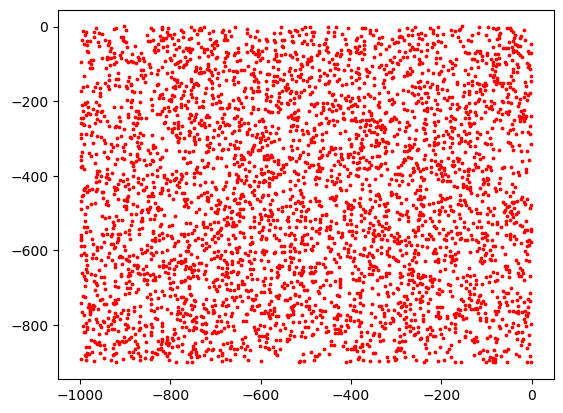

In [150]:
plt.scatter(X[:,0].cpu().numpy(),X[:,1].cpu().numpy(),c='r',s=3)

In [151]:
apd1.set_X(X = X)
apd1.set_As(As = As)
apd1.set_target_masses(target_masses = TV)
apd1.set_W(W=torch.zeros(apd1.N).to(device=apd1.device,dtype=apd1.dt))
apd1.error_tolerance = 0.1
apd1.set_pixel_params()

In [152]:
apd1.pixel_params

(3459, 3459)

In [153]:
apd1.assemble_pixels()

In [154]:
apd1.optimality

True

In [155]:
apd1.W

tensor([0., 0., 0.,  ..., 0., 0., 0.], device='cuda:0')

In [156]:
apd1.check_optimality()

Precision loss detected!
Percentage error =  30786.14911673471


In [157]:
apd1.find_optimal_W()

Solver tolerance is with respect to each grain separately.
Smallest tol:  tensor(0.0752228212, device='cuda:0')
Optimality condition successfully overwritten.
Optimization terminated successfully.
         Current function value: -251781531.351929
         Iterations: 473
         Function evaluations: 486
It took 75.8550717830658 seconds to find optimal W.


In [68]:
apd1.check_optimality()

The APD is optimal!
Percentage error =  9.718357003127915


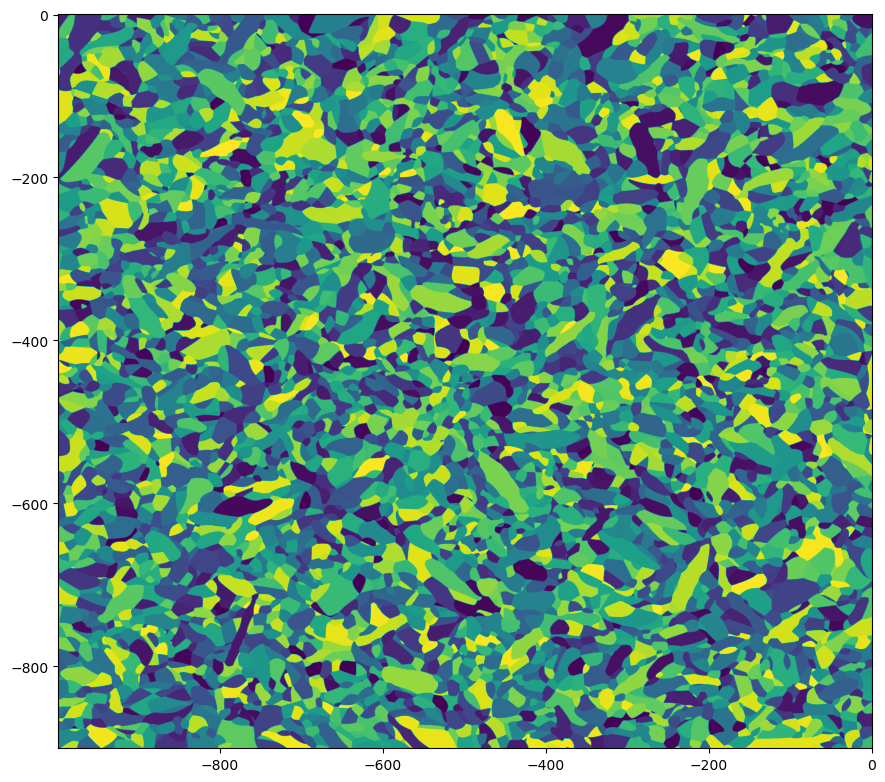

In [158]:
fig1, ax1 = apd1.plot_apd()

In [159]:
apd1.Lloyds_algorithm(K=5,verbosity_level = 2)

Lloyds iteration: 0
Solver tolerance is with respect to each grain separately.
Smallest tol:  tensor(0.0752228212, device='cuda:0')
Optimality condition successfully overwritten.
Optimization terminated successfully.
         Current function value: -251781532.300289
         Iterations: 1
         Function evaluations: 3
It took 0.5211067199707031 seconds to find optimal W.
The APD is optimal!
Percentage error =  8.701852594500647
Lloyds iteration: 1
Solver tolerance is with respect to each grain separately.
Smallest tol:  tensor(0.0752228212, device='cuda:0')
Optimality condition successfully overwritten.
Optimization terminated successfully.
         Current function value: -72432064.075224
         Iterations: 503
         Function evaluations: 520
It took 81.27331900596619 seconds to find optimal W.
The APD is optimal!
Percentage error =  8.701852594500647
Lloyds iteration: 2
Solver tolerance is with respect to each grain separately.
Smallest tol:  tensor(0.0752228212, device='cud

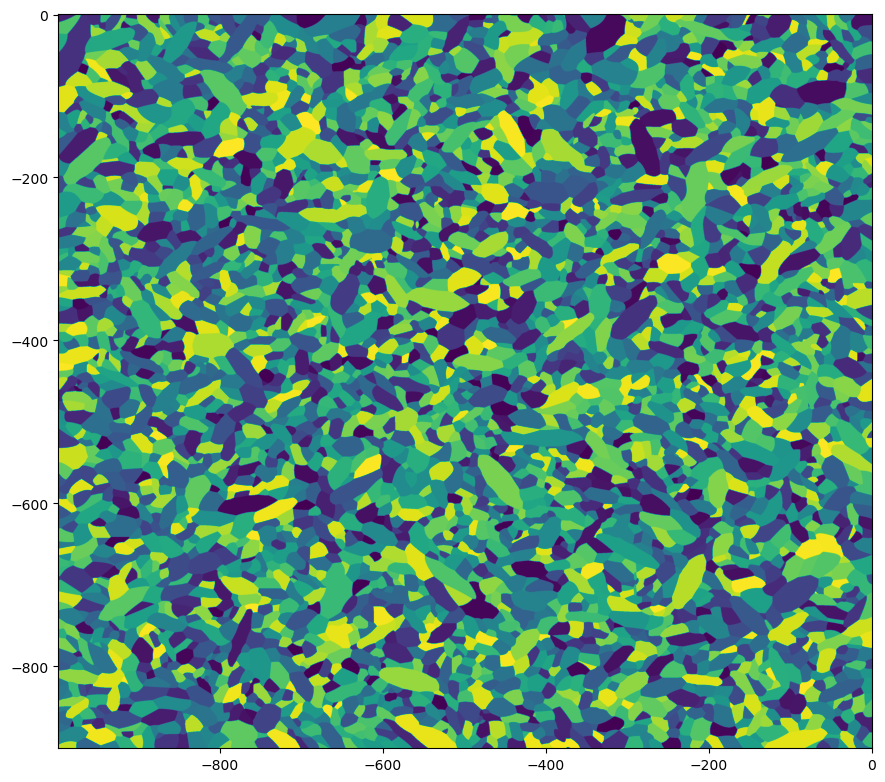

In [160]:
fig2, ax2 = apd1.plot_apd()

In [161]:
apd1.error_tolerance = 0.05
apd1.set_pixel_params()
apd1.assemble_pixels()
apd1.pixel_params

(4892, 4892)

In [162]:
apd1.find_optimal_W()

Solver tolerance is with respect to each grain separately.
Smallest tol:  tensor(0.0376114106, device='cuda:0')
Optimality condition successfully overwritten.
Optimization terminated successfully.
         Current function value: -62064396.912984
         Iterations: 98
         Function evaluations: 103
It took 30.85055136680603 seconds to find optimal W.


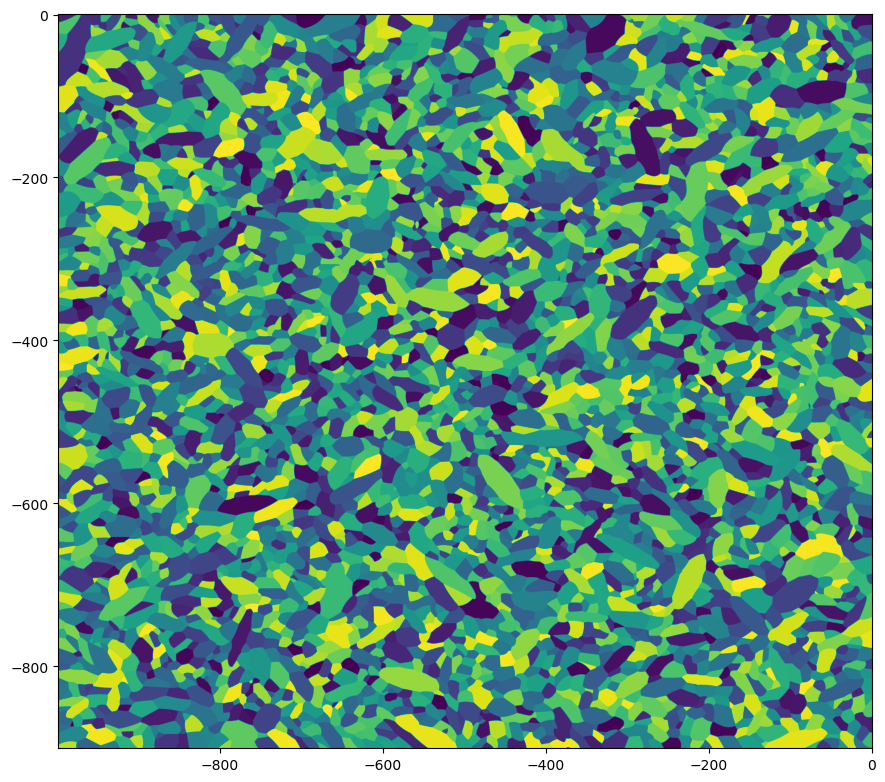

In [163]:
fig3, ax3 = apd1.plot_apd()

In [164]:
apd1.error_tolerance = 0.02
apd1.set_pixel_params()
apd1.assemble_pixels()
apd1.pixel_params

(7735, 7735)

In [165]:
apd1.find_optimal_W()

Solver tolerance is with respect to each grain separately.
Smallest tol:  tensor(0.0150445642, device='cuda:0')
Optimality condition successfully overwritten.
Optimization terminated successfully.
         Current function value: -62064504.356150
         Iterations: 57
         Function evaluations: 60
It took 43.26448130607605 seconds to find optimal W.


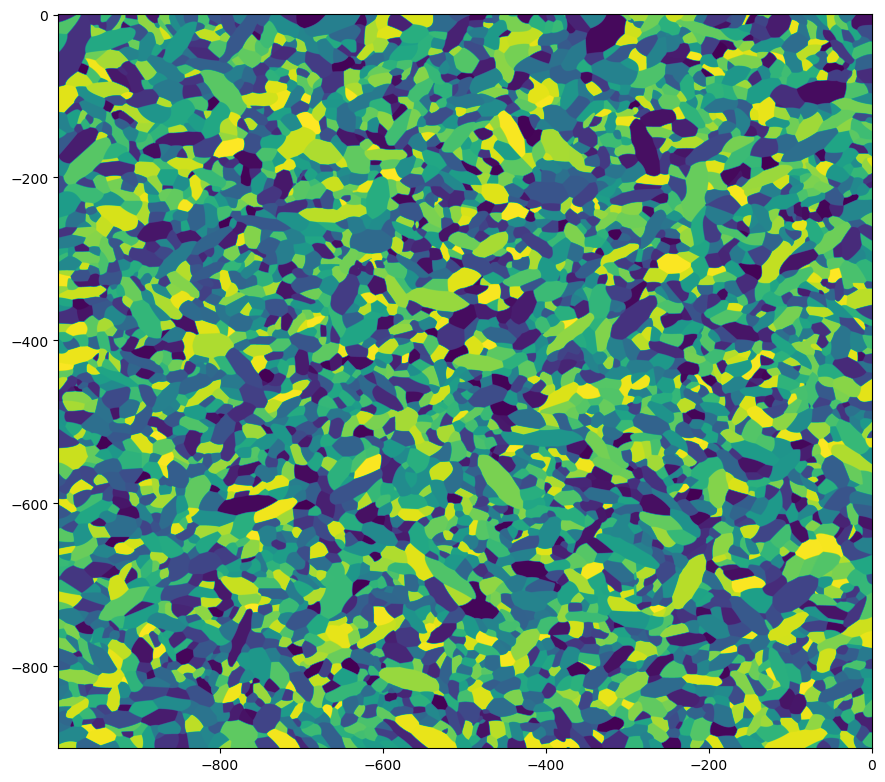

In [166]:
fig4, ax4 = apd1.plot_apd()

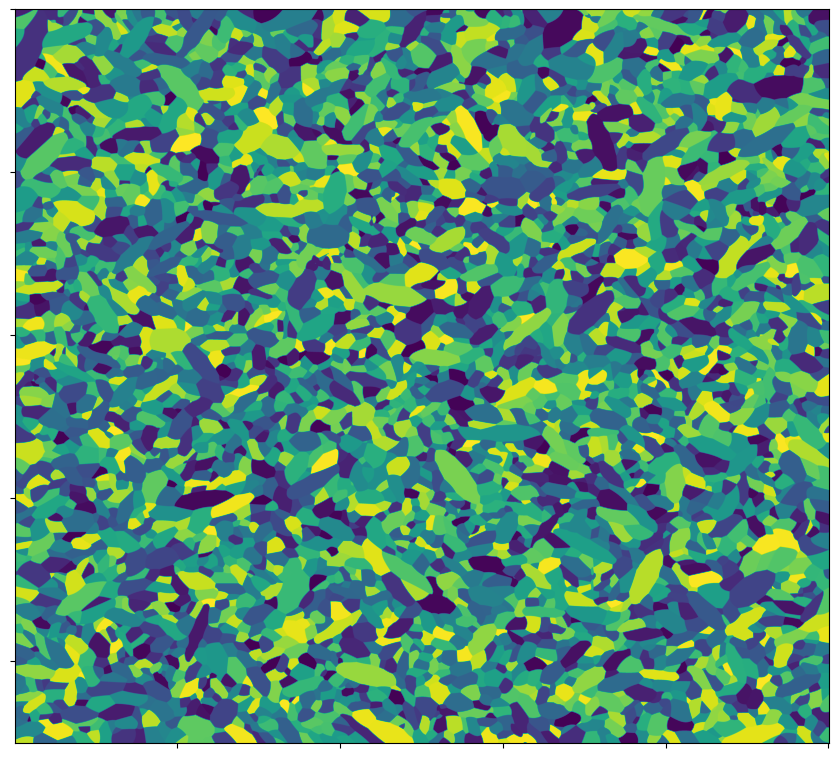

In [167]:
ax4.set_xticklabels([])
ax4.set_yticklabels([])

fig4.savefig('artificial_apd_mtex2.pdf')
fig4

In [78]:
apd1.error_tolerance = 0.01
apd1.set_pixel_params()
apd1.assemble_pixels()
apd1.pixel_params

(11102, 11102)

In [79]:
apd1.find_optimal_W()

Solver tolerance is with respect to each grain separately.
Smallest tol:  tensor(0.0073136781, device='cuda:0')
Optimality condition successfully overwritten.
Optimization terminated successfully.
         Current function value: -52894236.793067
         Iterations: 80
         Function evaluations: 83
It took 137.2596983909607 seconds to find optimal W.


In [ ]:
fig5, ax5 = apd1.plot_apd()

In [55]:
apd1.Lloyds_algorithm(K=5,verbosity_level = 2)

Lloyds iteration: 0
Solver tolerance is with respect to each grain separately.
Smallest tol:  tensor(0.0660547070, device='cuda:0')
Optimality condition successfully overwritten.
Optimization terminated successfully.
         Current function value: -47342907.603311
         Iterations: 61
         Function evaluations: 66
It took 9.738174676895142 seconds to find optimal W.
The APD is optimal!
Percentage error =  6.4379476556574415
Lloyds iteration: 1
Solver tolerance is with respect to each grain separately.
Smallest tol:  tensor(0.0660547070, device='cuda:0')
Optimality condition successfully overwritten.
Optimization terminated successfully.
         Current function value: -47011123.105120
         Iterations: 64
         Function evaluations: 68
It took 10.049787759780884 seconds to find optimal W.
The APD is optimal!
Percentage error =  5.520146728112949
Lloyds iteration: 2
Solver tolerance is with respect to each grain separately.
Smallest tol:  tensor(0.0660547070, device='cud

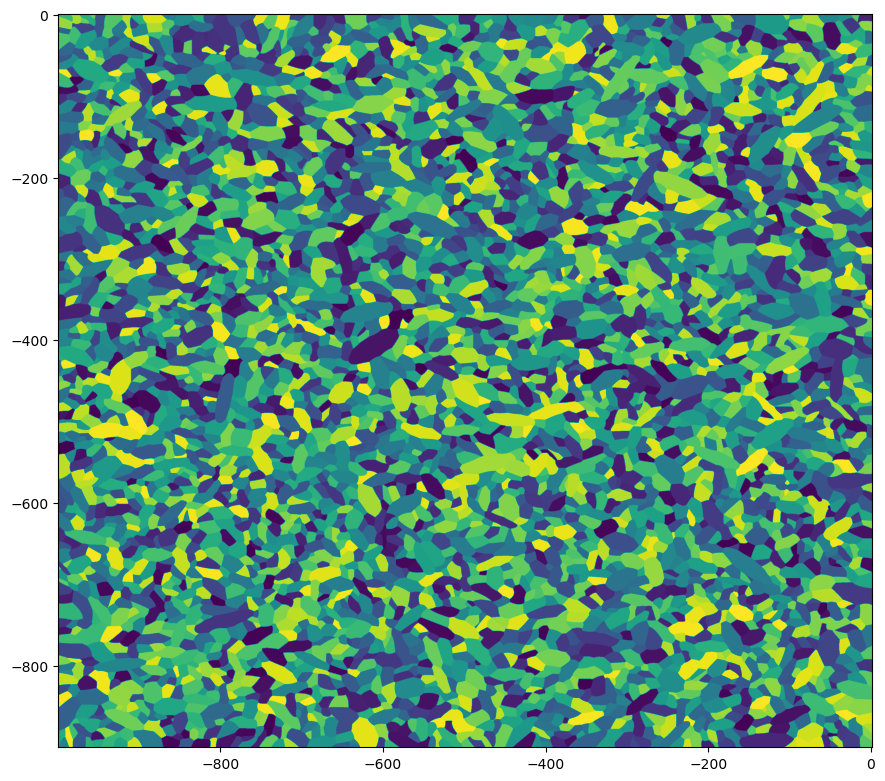

In [56]:
fig, ax1 = apd1.plot_apd()

In [57]:
apd1.Lloyds_algorithm(K=5,verbosity_level = 2)

Lloyds iteration: 0
Solver tolerance is with respect to each grain separately.
Smallest tol:  tensor(0.0660547070, device='cuda:0')
Optimality condition successfully overwritten.
Optimization terminated successfully.
         Current function value: -46356896.507288
         Iterations: 19
         Function evaluations: 23
It took 3.4115679264068604 seconds to find optimal W.
The APD is optimal!
Percentage error =  4.69389146344242
Lloyds iteration: 1
Solver tolerance is with respect to each grain separately.
Smallest tol:  tensor(0.0660547070, device='cuda:0')
Optimality condition successfully overwritten.
Optimization terminated successfully.
         Current function value: -46261917.920285
         Iterations: 1
         Function evaluations: 5
It took 0.6286399364471436 seconds to find optimal W.
The APD is optimal!
Percentage error =  9.732135241350427
Lloyds iteration: 2
Solver tolerance is with respect to each grain separately.
Smallest tol:  tensor(0.0660547070, device='cuda:0

In [60]:
apd1.error_tolerance = 0.01

In [62]:
apd1.find_optimal_W()

Solver tolerance is with respect to each grain separately.
Smallest tol:  tensor(0.0066054707, device='cuda:0')
Optimality condition successfully overwritten.



KeyboardInterrupt



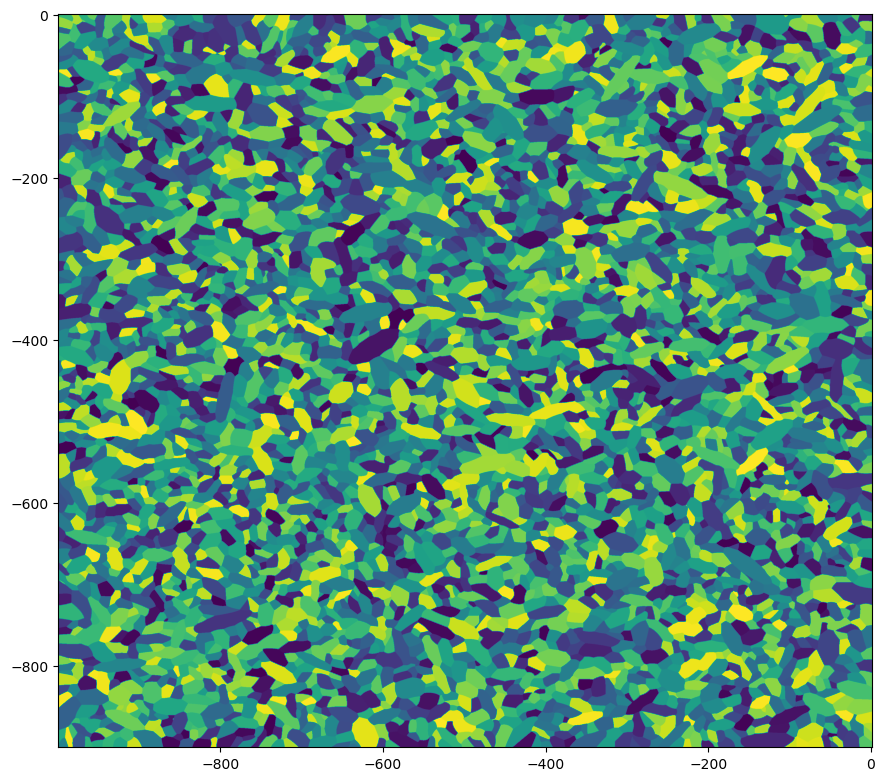

In [58]:
fig, ax1 = apd1.plot_apd()

In [ ]:
ax1.set_xticklabels([])
ax1.set_yticklabels([])

#fig.savefig('new_example1.pdf')
fig

(<Figure size 1050x1050 with 1 Axes>, <AxesSubplot: >)

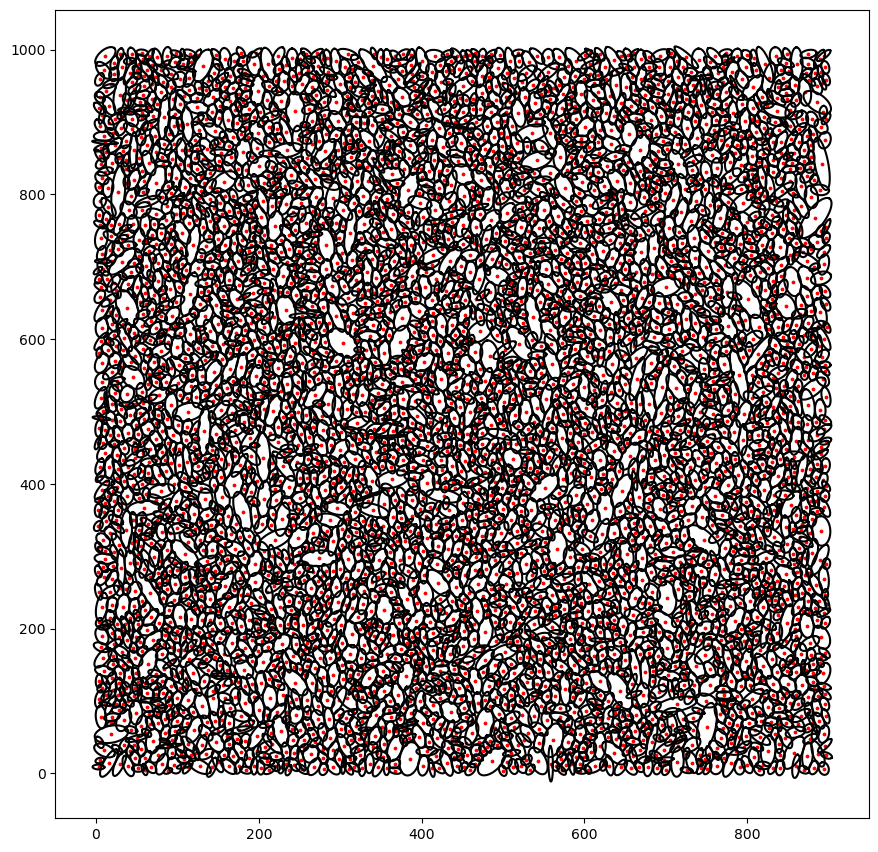

In [85]:
apd1.plot_ellipses()